# Training Analysis and Visualization Dashboard

### TLDR
This notebook compiles validation visualizations for model performance, currently focusing on the Resnet model trained on the Galaxy dataset.

### Objective
Conduct a comprehensive analysis of training dynamics and mask evolution for the Resnet architecture.

### Description
* **Data Selection**: Loads data for a specifically chosen epoch alongside complete training metrics and logs.
* **Trend Analysis**: Generates evolution curves for losses, accuracy, and regularization terms.
* **Performance Verification**: Verifies key performance indicators (accuracy, F1, recall, precision) for the selected epoch.
* **Error Analysis**: Renders the confusion matrix.
* **Feature Selection**: Visualizes the feature selection mask's evolution through both static views and animations.

### Results
* **Mask Evolution**: The mask demonstrates expected evolutionary behavior.
* **Classification Performance**: The selected epoch (150) exhibits strong classification performance despite significant pixel deselection.
* **Pending**: (TODO: quantify exact mask loss).


In [1]:
# Importing functions and methods.
import sys
import os

current_dir = os.getcwd() 
utils_path = os.path.abspath(os.path.join(current_dir, '..', '..', 'src', 'utils'))
models_path = os.path.abspath(os.path.join(current_dir, '..', '..', 'src', 'models'))
notebook_utils = os.path.abspath(os.path.join(current_dir, '..'))

if utils_path not in sys.path: sys.path.append(utils_path)
if models_path not in sys.path: sys.path.append(models_path)
if notebook_utils not in sys.path: sys.path.append(notebook_utils)

print(f"Adicionado ao PATH: {utils_path}")
print(f"Adicionado ao PATH: {models_path}")
print(f"Adicionado ao PATH: {notebook_utils}")

# 2. Third-party Library Imports (Data, Math, ML)
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, ConcatDataset
from torchvision import datasets, transforms

# 3. Visualization Imports
import matplotlib.pyplot as plt
import matplotlib as mlp
import seaborn as sns
import pandas as pd

# 4. Local/Project Imports (Custom Modules)
from StaticMaskTraining import StaticMaskTraining
import NotebookUtils as nu
import ModelTester as mt
import DatasetsDict as dd

Adicionado ao PATH: /home/andre-marques/Desktop/Estudo/PowerRangersCode/src/utils
Adicionado ao PATH: /home/andre-marques/Desktop/Estudo/PowerRangersCode/src/models
Adicionado ao PATH: /home/andre-marques/Desktop/Estudo/PowerRangersCode/notebooks


/home/andre-marques/anaconda3/envs/PowerRanger-env/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:

# no teste vai ser diferente, vamos fazer tudo pelo tester, uma vez que o load_checkpoint não é necessário 
# todas as análises das metricas serão feitas pelo pandas
# e não será necessário variáveis globais
# e vai ter curva roc e auc


In [15]:
# SETTING GLOBAL VARIABLES
var_global_checkpoint = "galaxy10_resnet34_test"
var_global_epoch = 160
var_root_dir = "../../checkpoints/"

# Setting the class helper
utils = nu.NotebookUtils()

In [4]:
# Getting the df
df = utils.load_training_log(var_global_checkpoint)


In [5]:
# Updating the DF since we have not calculated all the metrics in the training
df = utils.add_metrics_df(df, var_global_checkpoint)

In [6]:
# Visualization

df.head()

,epoch,total_loss,model_loss,mask_loss,val_accuracy,lambda_value,lambda_patience_count,val_precision,val_recall,val_f1_score
0,1,1.890553,0.890553,1.0,79.323308,1.0,0,77.753761,77.504173,77.028301
1,2,1.586406,0.586406,1.0,74.874687,1.0,0,79.572856,72.607735,73.946857
2,3,1.505621,0.505621,1.0,79.824561,1.0,0,82.366689,76.432105,76.971574
3,4,1.458150,0.458150,1.0,81.077694,1.0,0,79.035723,81.413076,79.240168
4,5,1.431646,0.431646,1.0,83.583960,1.0,0,84.037251,81.158865,81.844125


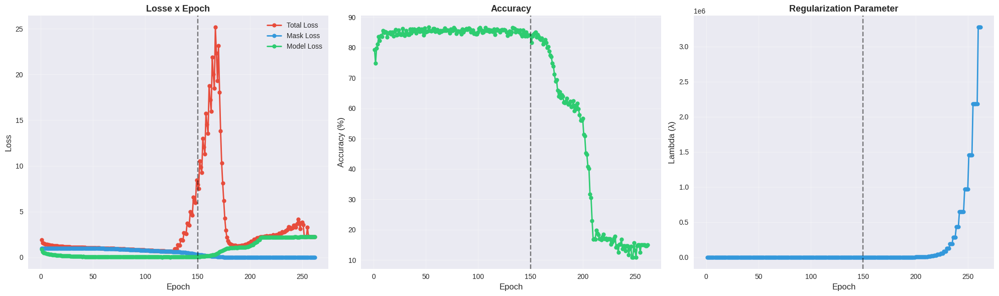

Epoch: 150
Accuracy: 83.7719298245614
F1-Score: 82.43408819659888
Recall: 81.8305156377567
Precision: 83.36504369613898


In [7]:
# Plotting all three losses, the specific metric, and the Lambda

plt.style.use('seaborn-v0_8')
fig, axes = plt.subplots(1, 3, figsize=(20,6)) 

METRIC = df.val_accuracy

# --- 1. Total Loss + Mask Loss + Model Loss ---
axes[0].plot(df.epoch, df.total_loss, 'o-', color='#e74c3c', linewidth=2, markersize=6, label='Total Loss')
axes[0].plot(df.epoch, df.mask_loss,  'o-', color='#3498db', linewidth=2, markersize=6, label='Mask Loss')
axes[0].plot(df.epoch, df.model_loss, 'o-', color='#2ecc71', linewidth=2, markersize=6, label='Model Loss')

axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Loss', fontsize=12)
axes[0].set_title('Losse x Epoch', fontsize=13, fontweight='bold')
axes[0].grid(True, alpha=0.3)
axes[0].legend(fontsize=10)

# --- 2. Accuracy ---
axes[1].plot(df.epoch, METRIC, 'o-', color='#2ecc71', linewidth=2, markersize=6)
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Accuracy (%)', fontsize=12)
axes[1].set_title('Accuracy', fontsize=13, fontweight='bold')
axes[1].grid(True, alpha=0.3)

# --- 3. Lambda ---
axes[2].plot(df.epoch, df.lambda_value, 'o-', color='#3498db', linewidth=2, markersize=6)
axes[2].set_xlabel('Epoch', fontsize=12)
axes[2].set_ylabel('Lambda (λ)', fontsize=12)
axes[2].set_title('Regularization Parameter', fontsize=13, fontweight='bold')
axes[2].grid(True, alpha=0.3)

# Vertical lines to see which epoch are we listening
for ax in axes:
    ax.axvline(x=var_global_epoch, color='black', linestyle='--', alpha=0.5, label='Selected Epoch')

plt.tight_layout()
plt.show()

print(f"Epoch: {var_global_epoch}\nAccuracy: {df.at[var_global_epoch+1, "val_accuracy"]}\nF1-Score: {df.at[var_global_epoch+1, "val_f1_score"]}\nRecall: {df.at[var_global_epoch+1, "val_recall"]}\nPrecision: {df.at[var_global_epoch+1, "val_precision"]}")

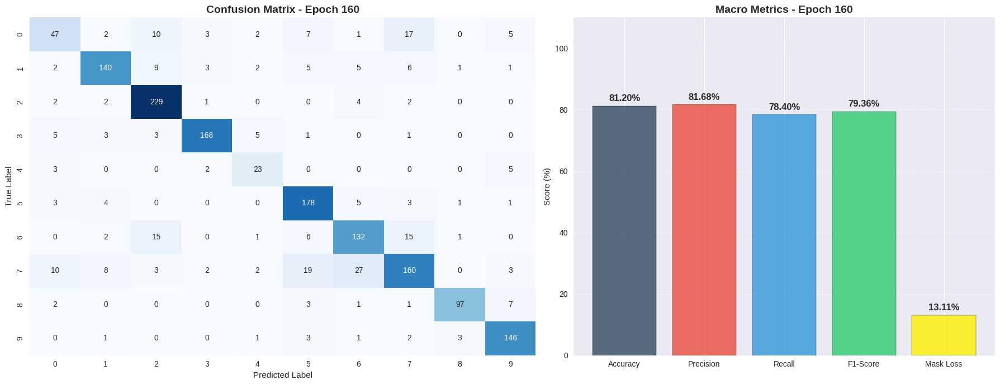

In [16]:
# 1. Load data for the specific epoch
checkpoint = utils.load_checkpoint(var_global_checkpoint, var_global_epoch)
cm = checkpoint['cm']

# 2. Setup Figure Layout (1 row, 2 columns)
fig, ax = plt.subplots(1, 2, figsize=(18, 7), gridspec_kw={'width_ratios': [1.2, 1]})

# --- LEFT SIDE: Confusion Matrix ---
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax[0], cbar=False)
ax[0].set_title(f'Confusion Matrix - Epoch {var_global_epoch}', fontsize=14, fontweight='bold')
ax[0].set_xlabel('Predicted Label')
ax[0].set_ylabel('True Label')

# --- RIGHT SIDE: Performance Metrics Bar Chart ---
# Extracting values from the dataframe (using index matching var_global_epoch + 1)
metrics_values_idx = [
    df.at[var_global_epoch + 1, "val_accuracy"], 
    df.at[var_global_epoch + 1, "val_precision"], 
    df.at[var_global_epoch + 1, "val_recall"], 
    df.at[var_global_epoch + 1, "val_f1_score"],
    df.at[var_global_epoch + 1, "mask_loss"] * 100
]

metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'Mask Loss']
colors = ['#34495e', '#e74c3c', '#3498db', '#2ecc71', '#FFEF00'] # Elegant colors: Slate, Red, Blue, Green

bars = ax[1].bar(metrics_names, metrics_values_idx, color=colors, alpha=0.8, edgecolor='black')

# Customizing the bar chart
ax[1].set_ylim(0, 110) 
ax[1].set_title(f'Macro Metrics - Epoch {var_global_epoch}', fontsize=14, fontweight='bold')
ax[1].set_ylabel('Score (%)')
ax[1].grid(axis='y', linestyle='--', alpha=0.6)

# Adding value labels on top of each bar
for bar in bars:
    height = bar.get_height()
    ax[1].text(bar.get_x() + bar.get_width()/2., height + 1,
                f'{height:.2f}%', ha='center', va='bottom', fontweight='bold', fontsize=12)

plt.tight_layout()
plt.show()

In [9]:
masks = []
ratio = 3
for i in range(1, len(df) + 1, ratio):  # the ratio of epochs printed in the animation
    checkpoint = utils.load_checkpoint(var_global_checkpoint, i)
    if checkpoint is not None and 'mask_state_dict' in checkpoint:
        mask_dict = checkpoint['mask_state_dict']
        m = mask_dict['mask'].squeeze().cpu().detach()
        rounded = torch.round(torch.sigmoid(m)).numpy()
        
        masks.append(rounded)
    else:
        print(f"Warning: Mask not found. {i}")

utils.animate_notebook(masks, ratio, cmap="gray", vmin=0, vmax=1, title_prefix="Epoch")

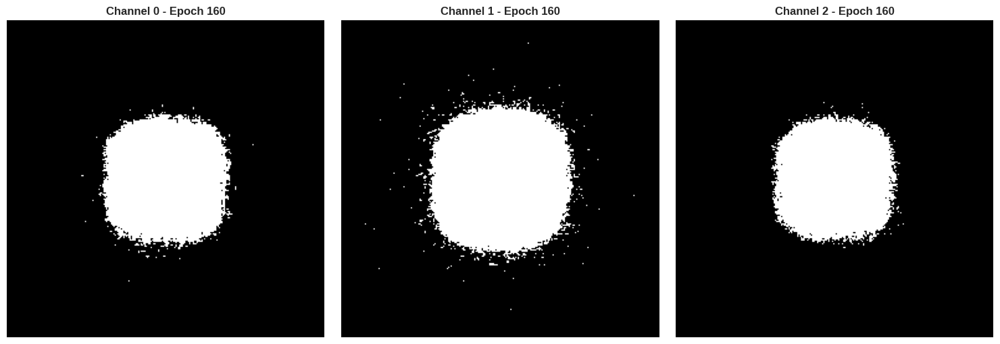

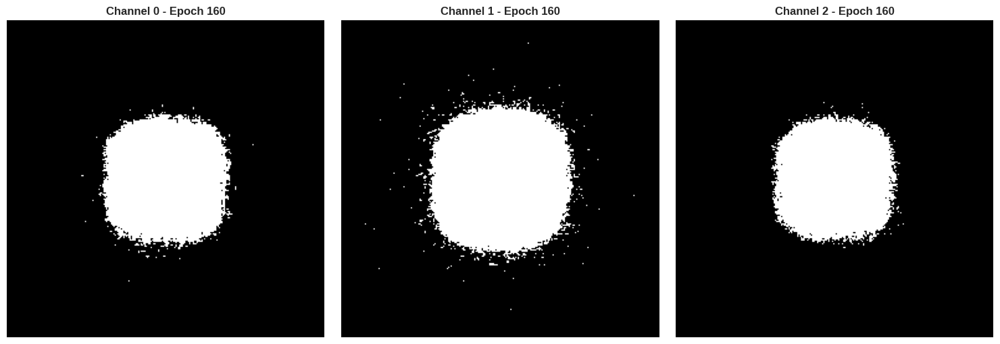

In [17]:
utils.plot_mask(var_global_checkpoint, var_global_epoch)